In [51]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import load_model
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout, BatchNormalization
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau

from sklearn.metrics import classification_report, confusion_matrix

import os
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import Image 
import random
import cv2

In [3]:
train_dir = r"C:\Users\ASUS\Desktop\wastes\train"
test_dir = r"C:\Users\ASUS\Desktop\wastes\test"

automobile wastes: 867 images


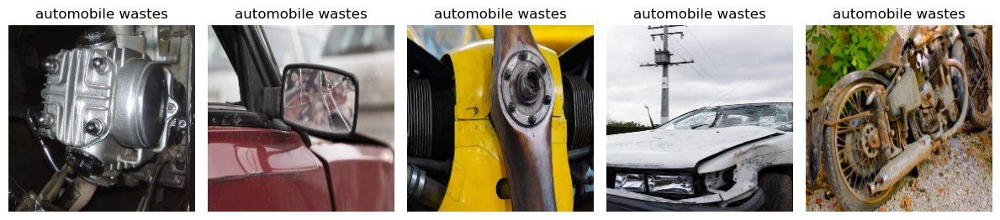

battery waste: 846 images


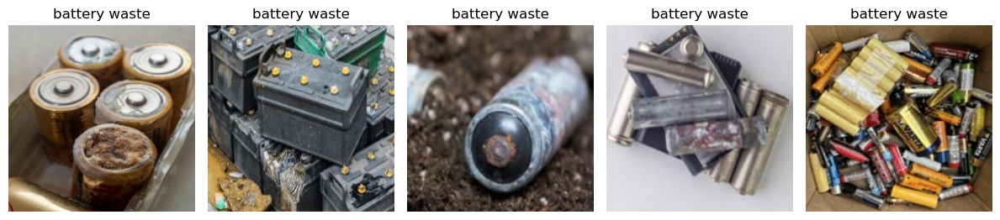

E-waste: 1248 images


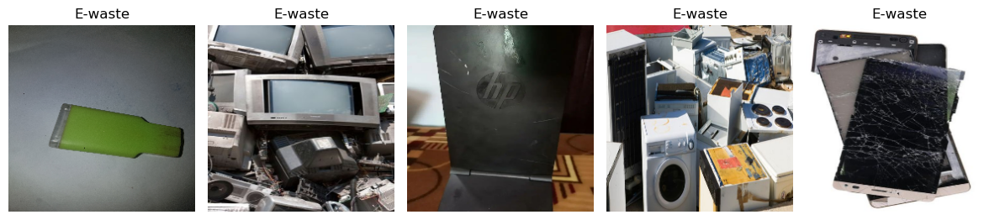

glass waste: 1018 images


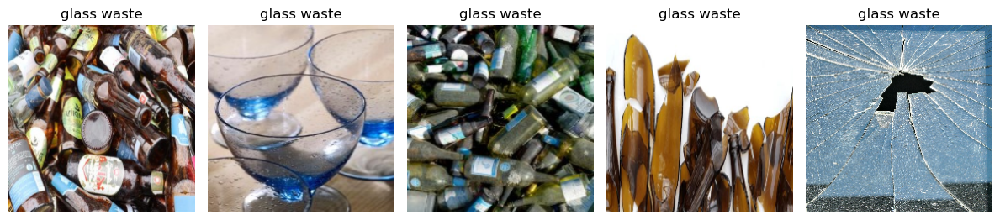

light bulbs: 420 images


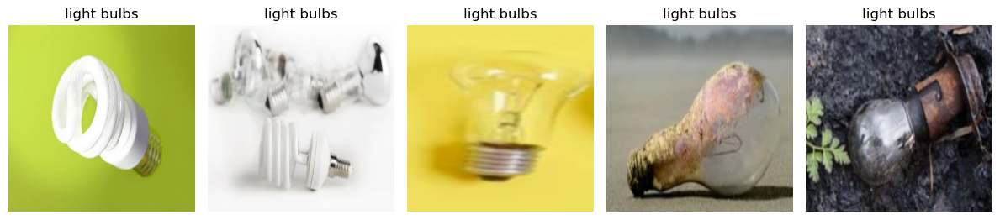

metal waste: 1214 images


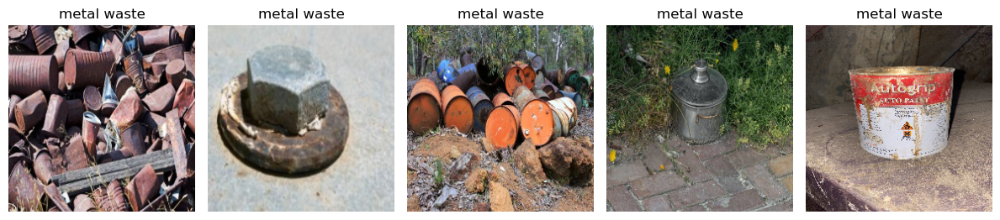

organic waste: 442 images


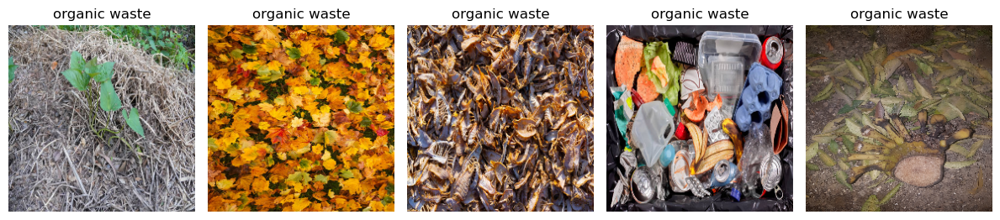

paper waste: 1333 images


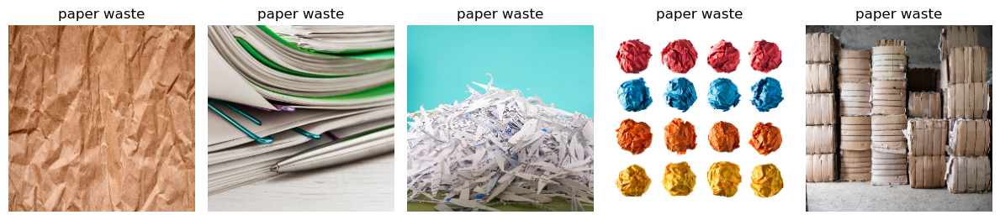

plastic waste: 1191 images


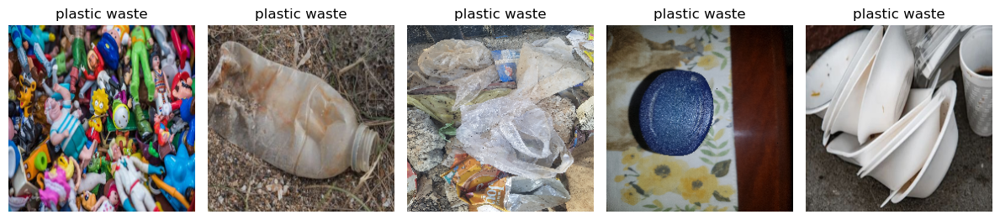

In [55]:
train_dir = r"C:\Users\ASUS\Desktop\wastes\train"
for class_name in os.listdir(train_dir):
    class_path = os.path.join(train_dir, class_name)
    images = [os.path.join(class_path, f) for f in os.listdir(class_path) if f.endswith('.jpg')]
    print(f"{class_name}: {len(images)} images")

    if len(images) >= 5:
        plt.figure(figsize=(12, 3))
        for i, img_path in enumerate(random.sample(images, 5)):
            img = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)
            plt.subplot(1, 5, i+1)
            plt.imshow(cv2.resize(img, (224, 224)))
            plt.axis('off')
            plt.title(class_name)
        plt.tight_layout()
        plt.show()

automobile wastes: 218 images


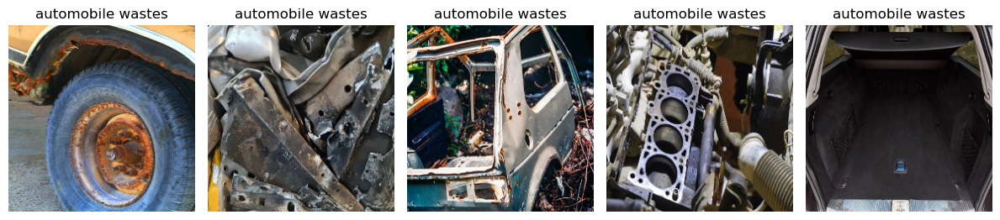

battery waste: 213 images


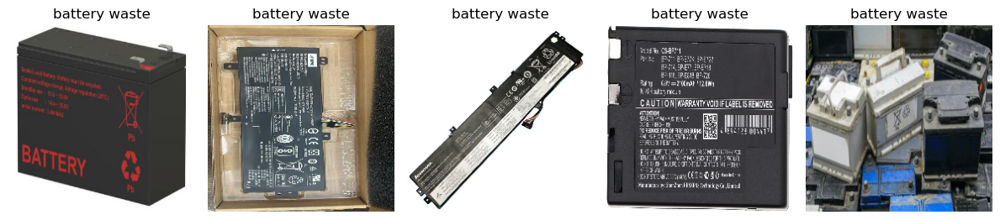

E-waste: 312 images


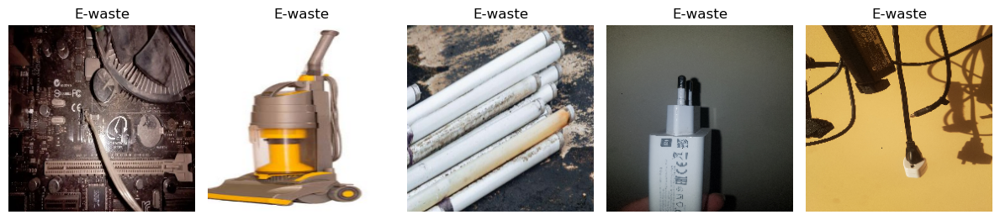

glass waste: 256 images


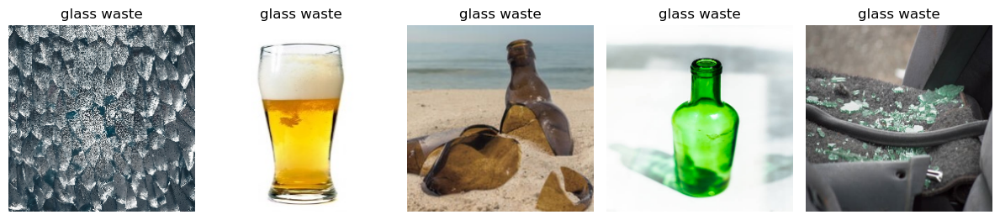

light bulbs: 105 images


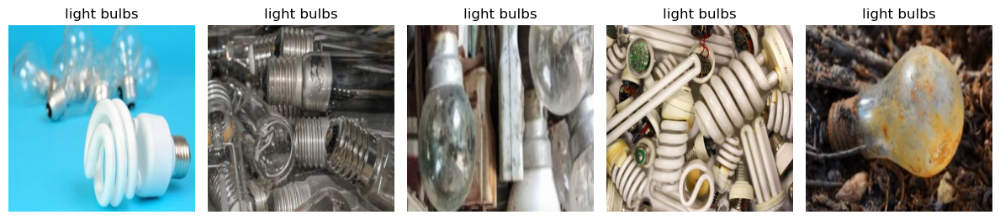

metal waste: 303 images


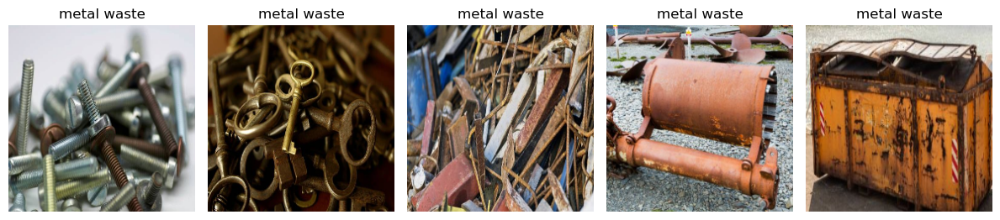

organic waste: 103 images


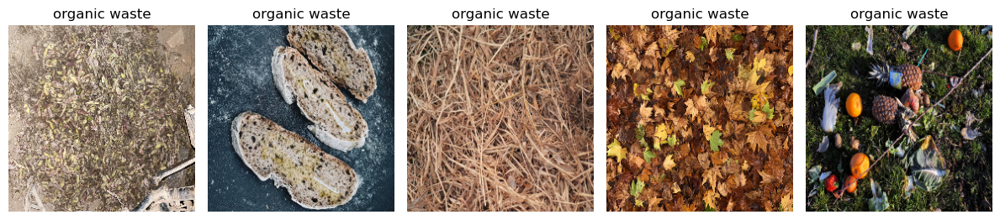

paper waste: 329 images


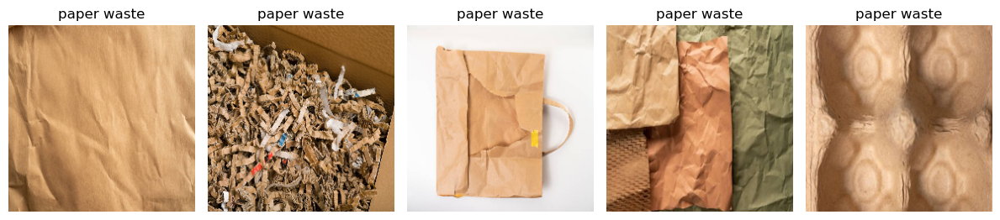

plastic waste: 298 images


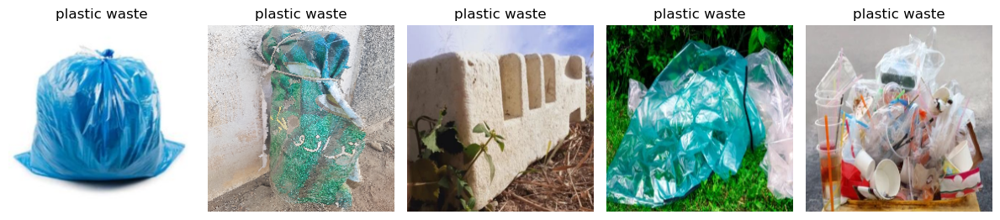

In [59]:
test_dir = r"C:\Users\ASUS\Desktop\wastes\test"
for class_name in os.listdir(test_dir):
    class_path = os.path.join(test_dir, class_name)
    images = [os.path.join(class_path, f) for f in os.listdir(class_path) if f.endswith('.jpg')]
    print(f"{class_name}: {len(images)} images")

    if len(images) >= 5:
        plt.figure(figsize=(12, 3))
        for i, img_path in enumerate(random.sample(images, 5)):
            img = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)
            plt.subplot(1, 5, i+1)
            plt.imshow(cv2.resize(img, (224, 224)))
            plt.axis('off')
            plt.title(class_name)
        plt.tight_layout()
        plt.show()

In [11]:
# Set parameters for image size and batch size
IMG_SIZE = (224, 224)  
BATCH_SIZE = 32 
BASE_DIR = r"C:\Users\ASUS\Desktop\wastes"

# Train data generator with augmentation
train_datagen = ImageDataGenerator(
    rescale=1.0/255,  rotation_range=30,  
    width_shift_range=0.2,  
    height_shift_range=0.2,  
    shear_range=0.2, zoom_range=0.2,  
    horizontal_flip=True, 
    fill_mode='nearest'  
)

# Test data generator 
test_datagen = ImageDataGenerator(rescale=1.0/255)  

# Training data generator using the training directory
train_generator = train_datagen.flow_from_directory(
    directory=os.path.join(BASE_DIR , 'train'),  
    target_size=IMG_SIZE,  
    batch_size=BATCH_SIZE, 
    class_mode='categorical'  
)

# Test data generator using the test directory
test_generator = test_datagen.flow_from_directory(
    directory=os.path.join(BASE_DIR , 'test'),  
    target_size=IMG_SIZE,  
    batch_size=BATCH_SIZE,  
    class_mode='categorical',  
    shuffle=False  
)

Found 9214 images belonging to 9 classes.
Found 2307 images belonging to 9 classes.


In [65]:
# Get class labels from the training dataset
class_labels = train_generator.class_indices  
 
print("Class Labels and Encoded Values:")
print(class_labels)

reversed_labels = {k: i for i, k in class_labels.items()}
print("\nReversed Encoded Labels:")
print(reversed_labels)

Class Labels and Encoded Values:
{'E-waste': 0, 'automobile wastes': 1, 'battery waste': 2, 'glass waste': 3, 'light bulbs': 4, 'metal waste': 5, 'organic waste': 6, 'paper waste': 7, 'plastic waste': 8}

Reversed Encoded Labels:
{0: 'E-waste', 1: 'automobile wastes', 2: 'battery waste', 3: 'glass waste', 4: 'light bulbs', 5: 'metal waste', 6: 'organic waste', 7: 'paper waste', 8: 'plastic waste'}


In [63]:
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Define the path for saving model weights
filepath = './final_model_weights.keras'  

# Early stopping callback: monitors the validation AUC (Area Under Curve)
earlystopping = EarlyStopping(monitor='val_auc',  
                              mode='max',         
                              patience=5,         
                              verbose=1)          

# Model checkpoint callback: saves the best model based on validation AUC
checkpoint = ModelCheckpoint(filepath,            
                              monitor='val_auc',  
                             mode='max',         
                              save_best_only=True,  
                              verbose=1)        

# List of callbacks to use during training
callback_list = [earlystopping, checkpoint]

In [17]:
# Base model: MobileNetV2 pre-trained on ImageNet
base_model = MobileNetV2(input_shape=(224, 224, 3),  
                          include_top=False,          
                          weights="imagenet")       

In [61]:
for layer in base_model.layers:
    layer.trainable = False  

In [25]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Flatten, BatchNormalization
from tensorflow.keras.applications import MobileNetV2

# Load the pretrained MobileNetV2 model without the top layers
base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
base_model.trainable = False 

# Redefining the model with reduced dense layer sizes
model = Sequential()
# Add the base model (MobileNetV2)
model.add(base_model)

model.add(Dropout(0.2))  
model.add(Flatten())  

model.add(BatchNormalization())  # Normalize the output of previous layer
model.add(Dense(512, activation="relu", kernel_initializer='he_uniform'))  
model.add(BatchNormalization())  
model.add(Dropout(0.2)) 
model.add(Dense(256, activation="relu", kernel_initializer='he_uniform'))  
model.add(BatchNormalization())  
model.add(Dropout(0.2))  

model.add(Dense(128, activation="relu", kernel_initializer='he_uniform'))  
model.add(Dropout(0.2))  

model.add(Dense(9, activation="softmax"))  

In [ ]:
model.compile(optimizer=Adam(learning_rate=0.0001),  
              loss='categorical_crossentropy', 
              metrics=['accuracy']) 
# Train the Model
history = model.fit(
    train_generator,  
    epochs=15, 
    validation_data=test_generator,  
    callbacks=callback_list  
)

Epoch 1/15


73/73 ━━━━━━━━━━━━━━━━━━━━ 160s 2s/step - accuracy: 0.8237 - loss: 0.5614
Test Accuracy: 81.40%


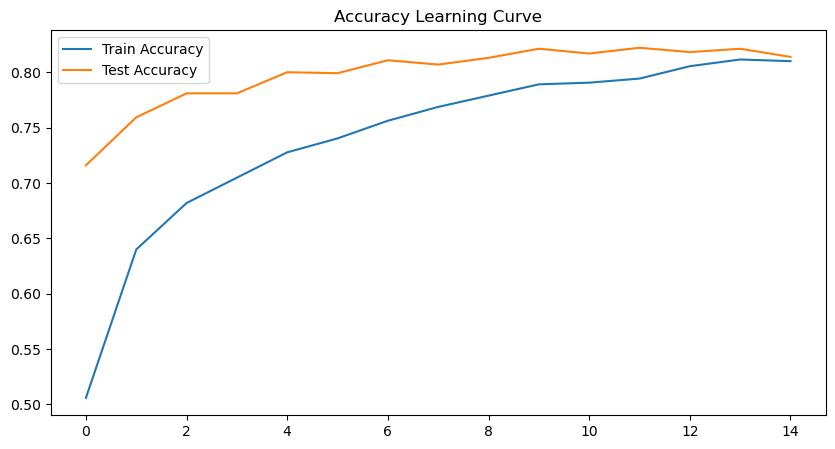

In [39]:
test_loss, test_accuracy = model.evaluate(test_generator)
print(f"Test Accuracy: {test_accuracy * 100:.2f}%")
plt.figure(figsize=(10, 5))
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Test Accuracy')
plt.legend()
plt.title('Accuracy Learning Curve')
plt.show()

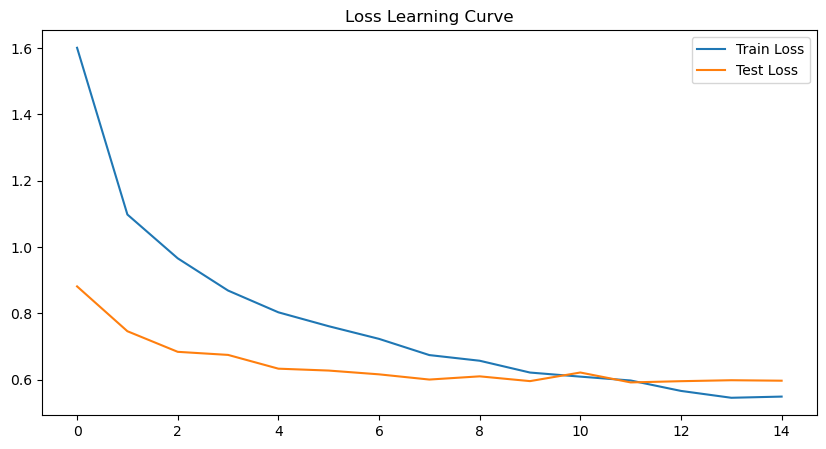

In [37]:
plt.figure(figsize=(10, 5))
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Test Loss')
plt.legend()
plt.title('Loss Learning Curve')
plt.show()

In [40]:
model.save("mobilenetv2_waste_classification.h5")
print("Model saved as mobilenetv2_waste_classification.h5")

Model saved as mobilenetv2_waste_classification.h5


In [43]:
from sklearn.metrics import classification_report
import numpy as np

test_generator.reset()
y_pred = model.predict(test_generator)
y_pred_classes = np.argmax(y_pred, axis=1)
y_true = test_generator.classes
class_labels = list(test_generator.class_indices.keys())

print("\nClassification Report:\n", classification_report(y_true, y_pred_classes, target_names=class_labels))

73/73 ━━━━━━━━━━━━━━━━━━━━ 163s 2s/step

Classification Report:
                    precision    recall  f1-score   support

          E-waste       0.78      0.83      0.81       312
automobile wastes       0.75      0.86      0.80       218
    battery waste       0.87      0.81      0.84       213
      glass waste       0.89      0.77      0.83       256
      light bulbs       0.82      0.80      0.81       105
      metal waste       0.74      0.80      0.77       308
    organic waste       0.87      0.89      0.88       223
      paper waste       0.83      0.86      0.85       343
    plastic waste       0.82      0.72      0.77       329

         accuracy                           0.81      2307
        macro avg       0.82      0.82      0.82      2307
     weighted avg       0.82      0.81      0.81      2307

